In [2]:
import pandas as pd
import numpy as np
import os
from collections import Counter
# from rdkit.Chem import AllChem, Draw
from rdkit import Chem
from scipy.stats import spearmanr
# from Bio.SeqUtils import seq1
import seaborn as sns
import matplotlib.pyplot as plt
res_folder = "/home/qcx679/hantang/UAAG2/results/Full_mask_5_virtual_node_mask_token_atomic_only_mask_diffusion_0917_variational_size"

In [3]:
all_folder = os.listdir(res_folder)
plt.rcParams.update({
    "font.size": 16,
    "font.weight": "bold",
    "axes.labelweight": "bold",
    "axes.titleweight": "bold",
    "legend.fontsize": 14
})

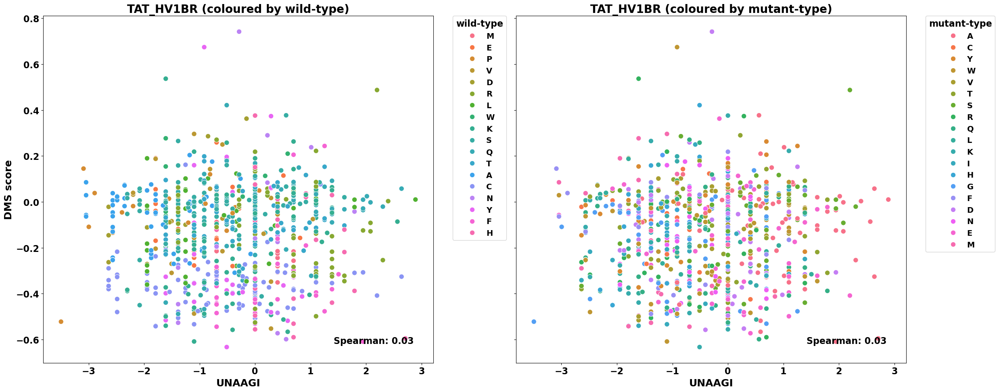

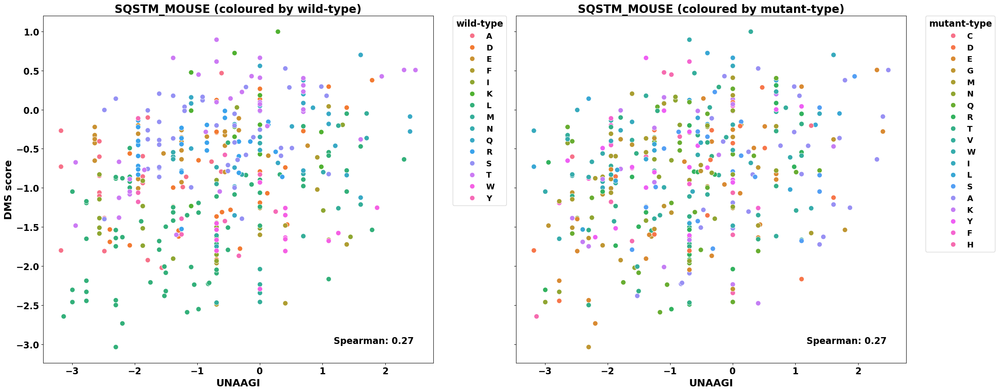

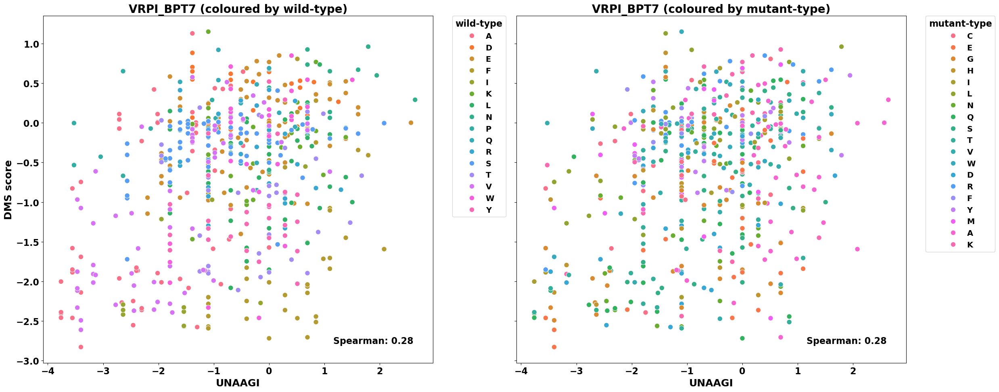

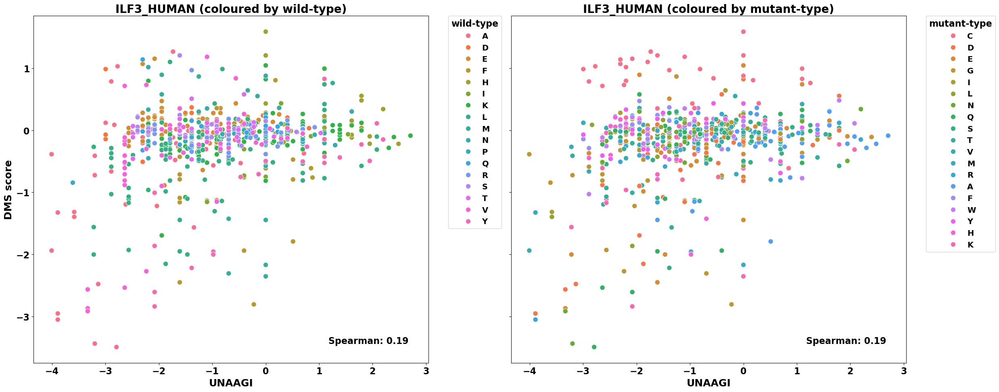

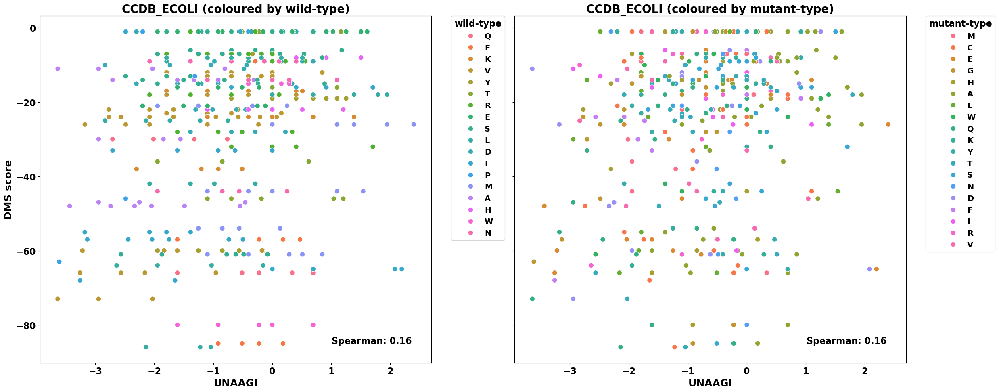

...

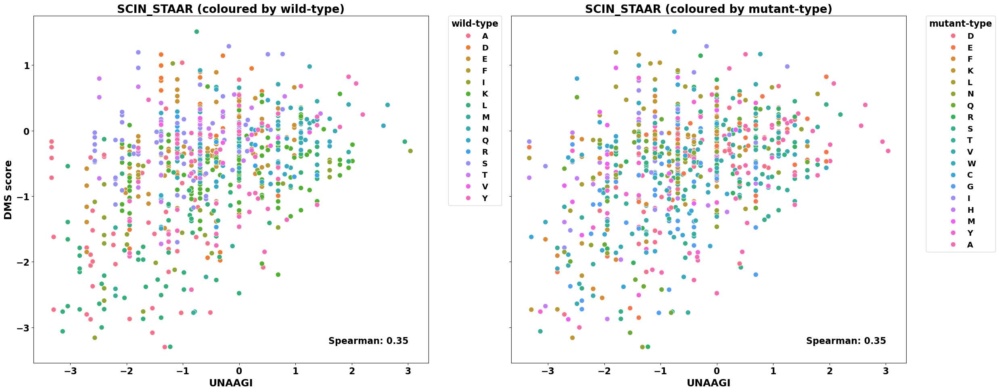

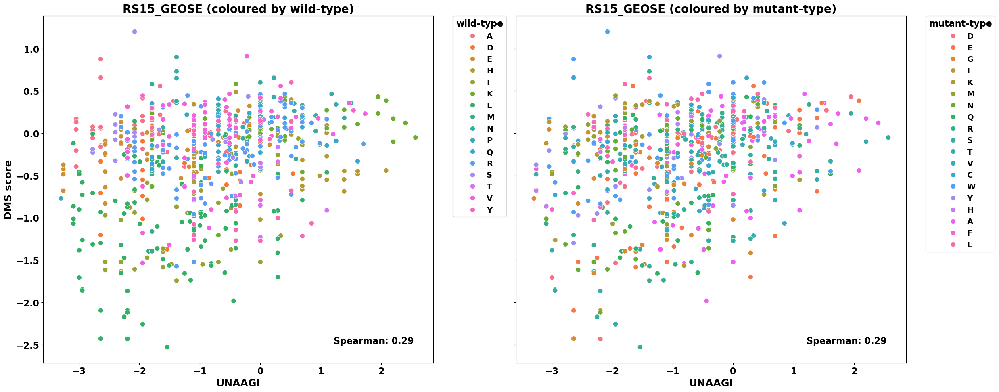

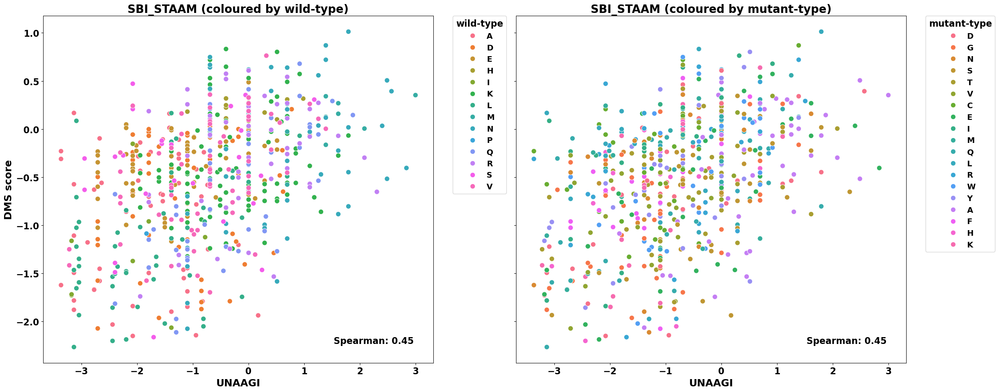

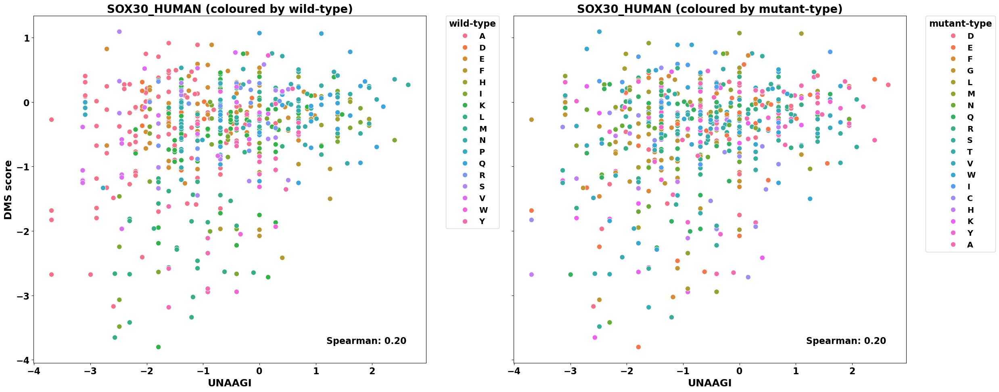

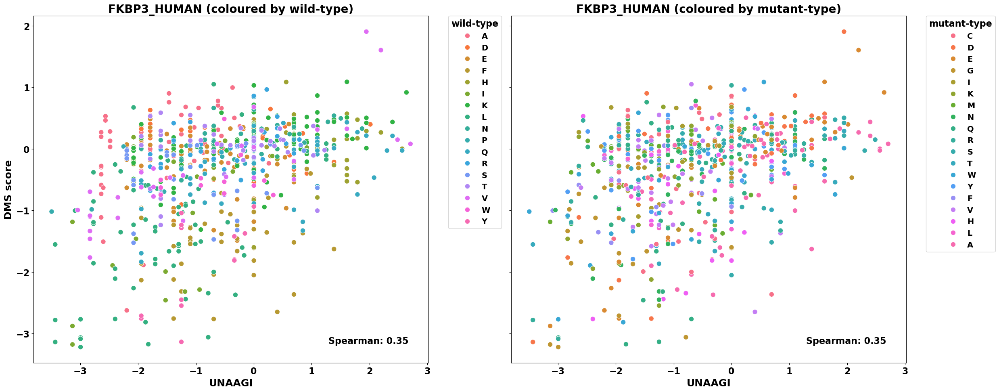

In [4]:
save_folder = "proteingym_scatter"
for folder in all_folder:
    full_path = os.path.join(res_folder, folder)
    benchmark_name = '_'.join(folder.split("_")[:2])
    result_table = pd.read_csv(os.path.join(full_path, "full_table.csv"))
    # rename wt_x to wild-type
    result_table = result_table.rename(columns={"wt_x": "wild-type", "mut": "mutant-type"})
    fig, axes = plt.subplots(1, 2, figsize=(25, 10), sharey=True)

    for ax, hue_col in zip(axes, ["wild-type", "mutant-type"]):
        sns.scatterplot(
            data=result_table, x="UNAAGI", y="DMS_score",
            hue=hue_col, alpha=1, s=80, ax=ax
        )

        # Title for each subplot
        ax.set_title(f"{benchmark_name} (coloured by {hue_col})", fontsize=20, fontweight="bold")

        # Axis labels
        ax.set_xlabel("UNAAGI", fontsize=18, fontweight="bold")
        ax.set_ylabel("DMS score", fontsize=18, fontweight="bold")

        # Spearman correlation (same value for both subplots)
        spearman_corr = spearmanr(result_table["UNAAGI"], result_table["DMS_score"]).correlation
        ax.text(
            0.95, 0.05, f"Spearman: {spearman_corr:.2f}",
            fontsize=16, fontweight="bold",
            ha="right", va="bottom", transform=ax.transAxes
        )

        # Legend formatting
        leg = ax.legend(
            title=hue_col, bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.
        )
        plt.setp(leg.get_texts(), fontsize=14, fontweight="bold")
        plt.setp(leg.get_title(), fontsize=16, fontweight="bold")

    plt.tight_layout()
    save_path = os.path.join(save_folder, f"{benchmark_name}.svg")
    plt.savefig(save_path, format="svg", bbox_inches="tight")
    plt.show()
    
    

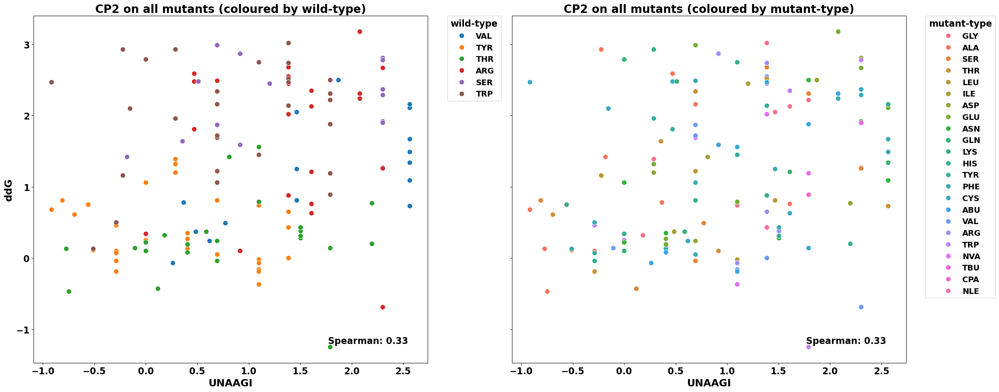

In [12]:
cp2_res_all = "/home/qcx679/hantang/UAAG2/results/CP2_Full_mask_5_virtual_node_mask_token_atomic_only_mask_diffusion_absorb_state_0917_variational_sampling/all_benchmark_results.csv"
benchmark_df = pd.read_csv(cp2_res_all)
result_table = benchmark_df.rename(columns={"aa": "wild-type", "target": "mutant-type", "value": "ddG", "pred": "UNAAGI"})
fig, axes = plt.subplots(1, 2, figsize=(25, 10), sharey=True)

for ax, hue_col in zip(axes, ["wild-type", "mutant-type"]):
    sns.scatterplot(
        data=result_table, x="UNAAGI", y="ddG",
        hue=hue_col, alpha=1, s=80, ax=ax
    )

    # Title for each subplot
    ax.set_title(f"CP2 on all mutants (coloured by {hue_col})", fontsize=20, fontweight="bold")

    # Axis labels
    ax.set_xlabel("UNAAGI", fontsize=18, fontweight="bold")
    ax.set_ylabel("ddG", fontsize=18, fontweight="bold")

    # Spearman correlation (same value for both subplots)
    spearman_corr = spearmanr(result_table["UNAAGI"], result_table["ddG"]).correlation
    ax.text(
        0.95, 0.05, f"Spearman: {spearman_corr:.2f}",
        fontsize=16, fontweight="bold",
        ha="right", va="bottom", transform=ax.transAxes
    )

    # Legend formatting
    leg = ax.legend(
        title=hue_col, bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.
    )
    plt.setp(leg.get_texts(), fontsize=14, fontweight="bold")
    plt.setp(leg.get_title(), fontsize=16, fontweight="bold")

plt.tight_layout()
save_path = os.path.join("CP2_all.svg")
plt.savefig(save_path, format="svg", bbox_inches="tight")
plt.show()



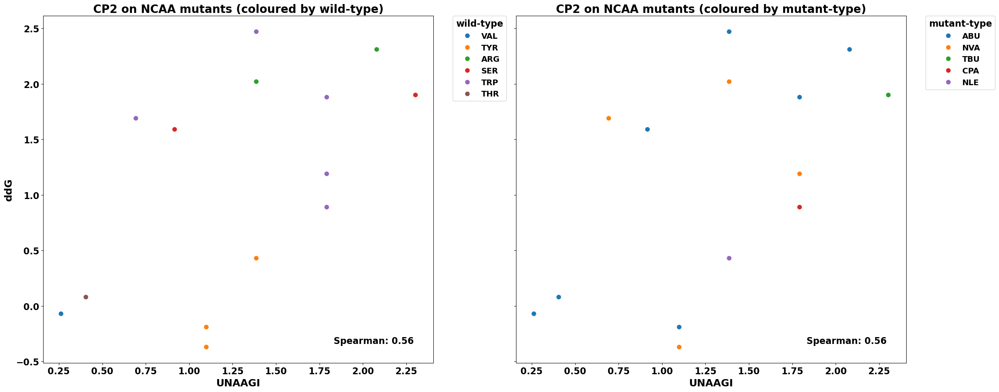

In [13]:
cp2_res_ncaa = "/home/qcx679/hantang/UAAG2/results/CP2_Full_mask_5_virtual_node_mask_token_atomic_only_mask_diffusion_absorb_state_0917_variational_sampling/uaa_benchmark_results.csv"
benchmark_df = pd.read_csv(cp2_res_ncaa)
result_table = benchmark_df.rename(columns={"aa": "wild-type", "target": "mutant-type", "value": "ddG", "pred": "UNAAGI"})
fig, axes = plt.subplots(1, 2, figsize=(25, 10), sharey=True)

for ax, hue_col in zip(axes, ["wild-type", "mutant-type"]):
    sns.scatterplot(
        data=result_table, x="UNAAGI", y="ddG",
        hue=hue_col, alpha=1, s=80, ax=ax
    )

    # Title for each subplot
    ax.set_title(f"CP2 on NCAA mutants (coloured by {hue_col})", fontsize=20, fontweight="bold")

    # Axis labels
    ax.set_xlabel("UNAAGI", fontsize=18, fontweight="bold")
    ax.set_ylabel("ddG", fontsize=18, fontweight="bold")

    # Spearman correlation (same value for both subplots)
    spearman_corr = spearmanr(result_table["UNAAGI"], result_table["ddG"]).correlation
    ax.text(
        0.95, 0.05, f"Spearman: {spearman_corr:.2f}",
        fontsize=16, fontweight="bold",
        ha="right", va="bottom", transform=ax.transAxes
    )

    # Legend formatting
    leg = ax.legend(
        title=hue_col, bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.
    )
    plt.setp(leg.get_texts(), fontsize=14, fontweight="bold")
    plt.setp(leg.get_title(), fontsize=16, fontweight="bold")

plt.tight_layout()
save_path = os.path.join("CP2_ncaa.svg")
plt.savefig(save_path, format="svg", bbox_inches="tight")
plt.show()



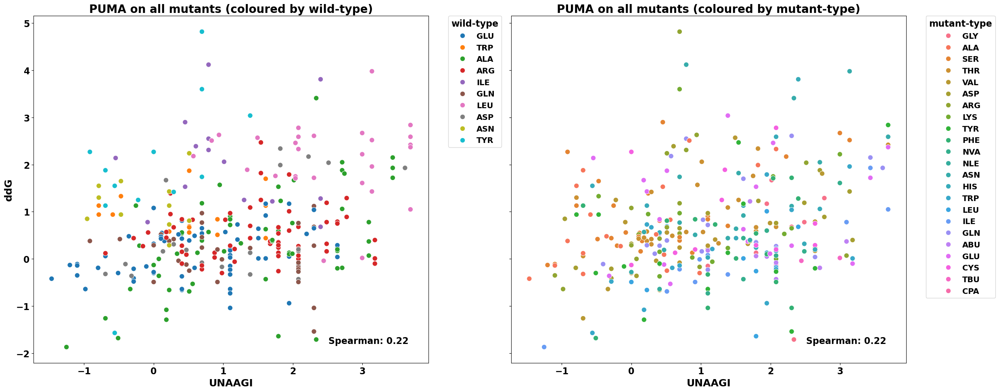

In [14]:
puma_res_all = "/home/qcx679/hantang/UAAG2/results/PUMA_Full_mask_5_virtual_node_mask_token_atomic_only_mask_diffusion_normalized_prior_0915_variational_sampling/all_benchmark_results.csv"
benchmark_df = pd.read_csv(puma_res_all)
result_table = benchmark_df.rename(columns={"aa": "wild-type", "target": "mutant-type", "value": "ddG", "pred": "UNAAGI"})
fig, axes = plt.subplots(1, 2, figsize=(25, 10), sharey=True)

for ax, hue_col in zip(axes, ["wild-type", "mutant-type"]):
    sns.scatterplot(
        data=result_table, x="UNAAGI", y="ddG",
        hue=hue_col, alpha=1, s=80, ax=ax
    )

    # Title for each subplot
    ax.set_title(f"PUMA on all mutants (coloured by {hue_col})", fontsize=20, fontweight="bold")

    # Axis labels
    ax.set_xlabel("UNAAGI", fontsize=18, fontweight="bold")
    ax.set_ylabel("ddG", fontsize=18, fontweight="bold")

    # Spearman correlation (same value for both subplots)
    spearman_corr = spearmanr(result_table["UNAAGI"], result_table["ddG"]).correlation
    ax.text(
        0.95, 0.05, f"Spearman: {spearman_corr:.2f}",
        fontsize=16, fontweight="bold",
        ha="right", va="bottom", transform=ax.transAxes
    )

    # Legend formatting
    leg = ax.legend(
        title=hue_col, bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.
    )
    plt.setp(leg.get_texts(), fontsize=14, fontweight="bold")
    plt.setp(leg.get_title(), fontsize=16, fontweight="bold")

plt.tight_layout()
save_path = os.path.join("PUMA_all.svg")
plt.savefig(save_path, format="svg", bbox_inches="tight")
plt.show()



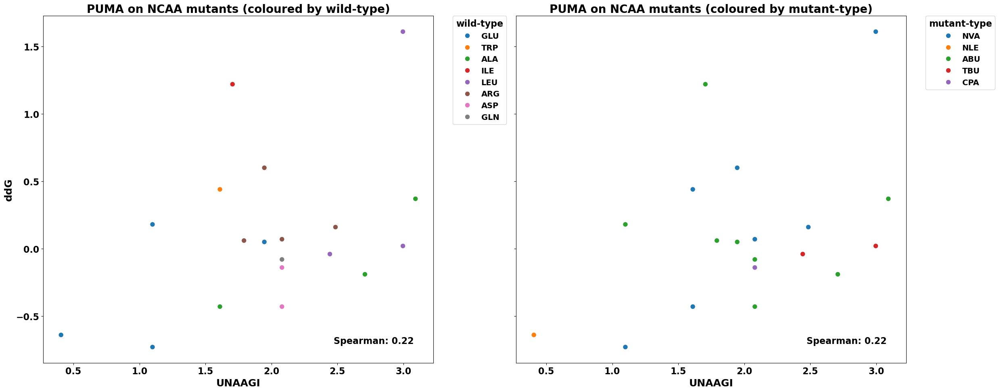

In [15]:
puma_res_ncaa = "/home/qcx679/hantang/UAAG2/results/PUMA_Full_mask_5_virtual_node_mask_token_atomic_only_mask_diffusion_normalized_prior_0915_variational_sampling/uaa_benchmark_results.csv"
benchmark_df = pd.read_csv(puma_res_ncaa)
result_table = benchmark_df.rename(columns={"aa": "wild-type", "target": "mutant-type", "value": "ddG", "pred": "UNAAGI"})
fig, axes = plt.subplots(1, 2, figsize=(25, 10), sharey=True)

for ax, hue_col in zip(axes, ["wild-type", "mutant-type"]):
    sns.scatterplot(
        data=result_table, x="UNAAGI", y="ddG",
        hue=hue_col, alpha=1, s=80, ax=ax
    )

    # Title for each subplot
    ax.set_title(f"PUMA on NCAA mutants (coloured by {hue_col})", fontsize=20, fontweight="bold")

    # Axis labels
    ax.set_xlabel("UNAAGI", fontsize=18, fontweight="bold")
    ax.set_ylabel("ddG", fontsize=18, fontweight="bold")

    # Spearman correlation (same value for both subplots)
    spearman_corr = spearmanr(result_table["UNAAGI"], result_table["ddG"]).correlation
    ax.text(
        0.95, 0.05, f"Spearman: {spearman_corr:.2f}",
        fontsize=16, fontweight="bold",
        ha="right", va="bottom", transform=ax.transAxes
    )

    # Legend formatting
    leg = ax.legend(
        title=hue_col, bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.
    )
    plt.setp(leg.get_texts(), fontsize=14, fontweight="bold")
    plt.setp(leg.get_title(), fontsize=16, fontweight="bold")

plt.tight_layout()
save_path = os.path.join("PUMA_ncaa.svg")
plt.savefig(save_path, format="svg", bbox_inches="tight")
plt.show()

